# Глубинное обучение, ИИ ВШЭ

## Домашнее задание 3. Детекция объектов.

### Общая информация

### Оценивание и штрафы

Максимально допустимая оценка за работу без бонусов — 10 баллов. Сдавать задание после указанного срока жесткого дедлайна нельзя.

Сдача работы после мягкого дедлайна штрафуется ступенчато, -1 балл в сутки. Один раз за модуль студентам предоставляется возможность использовать отсрочку и сдать в жесткий дедлайн без штрафа.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов. Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке. Также оценка может быть снижена за плохо читаемый код и плохо оформленные графики. Все ответы должны сопровождаться кодом или комментариями о том, как они были получены.

Использование генеративных моделей допустимо на следующих условиях:
- Количество кода, написанное генеративными моделями, не превышает 30%
- Указана модель, использованная для генерации, а также промпт
- В конце работы необходимо описать свой опыт использования генеративного ИИ для решения данного домашнего задания. Укажите как часто Вам приходилось исправлять код своими руками или просить модель что-то исправить. Было ли это быстрее, чем написать код самим?

В случае невыполнения этих требований работа не оценивается и оценка за неё не превышает 0 баллов.

### О задании

Сыграем в квиддич? Или лучше в карты?

В этом дз вам предстоит написать практически с нуля архитектуру для детекции, а также воспользоваться готовым решением. На выбор даётся два датасета, отличаются они только картинками. Форматы, баллы - все одинаково.

Первый вариант это датасет по кадрам игры в квиддич из Гарри Поттера. Если вы забыли правила, то нажмите [сюда](https://harrypotter.fandom.com/ru/wiki/%D0%9A%D0%B2%D0%B8%D0%B4%D0%B4%D0%B8%D1%87). Вы научитесь искать и выделять на фотографиях бладжеры, квоффл и снитч.

Второй вариант это датасет с игральными картами. Если вы забыли что такое карты, то нажмите [сюда](https://ru.wikipedia.org/wiki/%D0%98%D0%B3%D1%80%D0%B0%D0%BB%D1%8C%D0%BD%D1%8B%D0%B5_%D0%BA%D0%B0%D1%80%D1%82%D1%8B). Вы научитесь искать и выделять на фотографиях несколько типов карт.

Оба варианта содержат около 300 картинок, данные хранятся в xml в формате PascalVOC. Есть малые отличия, но ничего страшного.


Если с самописным детектором совсем не получается, то можно после создания датасетов перейти к концу, где обучается готовый, с ним будет проще :)

### Консультация 2023 года

https://www.youtube.com/watch?v=oCwEmKW3bYg

# Notes

Дз проверялось на работоспособность в colab. Не гарантируется, что будет работать на чем-то другом. На Windows, скорее всего, вас ждет немало проблем :(

По вопросам формулировок (не ошибок торча!), в случае отсутствия ответа в общем чате (поиск по чату позволяет проверить), можно написать в него с тегом @markblumenau.

## Данные

Скачайте один из датасетов на свой вкус и начните работу с ним.
Разметка находится в xmls папке, картинки в images.

In [1]:
!pip install ultralytics -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 37.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 58.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 46.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 30.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 82.2 MB/s eta 0:00:00


In [2]:
# Harry Potter -- uncomment
#!wget https://github.com/markblumenau/hw3_iad_dl/raw/main/harry/data.zip

# Cards -- uncomment
!wget https://github.com/markblumenau/hw3_iad_dl/raw/main/cards/data.zip
import glob
import shutil
from pathlib import Path
from xml.etree import ElementTree as ET

import albumentations as A
import matplotlib.pyplot as plt
import numpy as np
import torch
import torchvision
import ultralytics
from albumentations.pytorch.transforms import ToTensorV2
from matplotlib.patches import Rectangle
from PIL import Image
from torch import nn
from torchvision.models import ResNet50_Weights
from tqdm.notebook import tqdm

!unzip -q data.zip

--2025-05-14 17:07:32--  https://github.com/markblumenau/hw3_iad_dl/raw/main/cards/data.zip
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/markblumenau/hw3_iad_dl/main/cards/data.zip [following]
--2025-05-14 17:07:32--  https://raw.githubusercontent.com/markblumenau/hw3_iad_dl/main/cards/data.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 38392108 (37M) [application/zip]
Saving to: ‘data.zip’

data.zip            100%[===================>]  36.61M  --.-KB/s    in 0.09s   

2025-05-14 17:07:33 (423 MB/s) - ‘data.zip’ saved [38392108/38392108]

Creating new Ultralytics Settings v0.0.6 fi

In [ ]:
with open("./data/xmls/IMG_2383.xml", "r") as f:
  print(f.read())

<annotation>
	<folder>test</folder>
	<filename>IMG_2383.JPG</filename>
	<path>C:\tensorflow_cards\test\IMG_2383.JPG</path>
	<source>
		<database>Unknown</database>
	</source>
	<size>
		<width>378</width>
		<height>504</height>
		<depth>3</depth>
	</size>
	<segmented>0</segmented>
	<object>
		<name>ace</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>97</xmin>
			<ymin>136</ymin>
			<xmax>275</xmax>
			<ymax>368</ymax>
		</bndbox>
	</object>
</annotation>



# Задача 1. 0.5 балла.

Ниже написан код для стандартного Dataset из библиотеки pytorch. Dataset требует реализации `__getitem__` и `__len__` методов. Далее эти методы будут использованы для формирования батчей для обучения. Поскольку читать придется из xml файлов, нужно перед этим дописать функцию get_xml_data, чтобы по названию картинки подтягивать аннотации.

Функции можно и нужно передать некий class_dict. Он есть и при инициализации датасета ниже. С его помощью можно название класса превратить в int. Далее подразумевается, что класс идёт как int.

In [3]:
def get_xml_data(image_name, root, class_dict, xml_prefix="/xmls/"):
    # get smth like ZZZ/YYY/XXXXXX.jpg -> XXXXXX
    filename = image_name.split("/")[-1].split(".")[0]
    # read xml
    tree = ET.parse(str(root) + xml_prefix + filename + ".xml")
    treeroot = tree.getroot()
    # iterate over bboxes
    bboxes = []
    for member in treeroot.findall("object"):
      class_idx = class_dict[member.find("name").text] # ищем индекс класса

      xmin = int(member.find("bndbox/xmin").text)
      ymin = int(member.find("bndbox/ymin").text)
      xmax = int(member.find("bndbox/xmax").text)
      ymax = int(member.find("bndbox/ymax").text)

        # См. доку https://albumentations.ai/docs/getting_started/bounding_boxes_augmentation/
        # Нас интересует pascal_voc формат, далее применяется он.

      res = [xmin, ymin, xmax, ymax, class_idx]
      bboxes.append(res)

    return bboxes

In [4]:
#тест

with open(str(Path("./data")) + "/class_dict", "r") as f:
  class_dict_test = eval(f.readline())

bboxes = get_xml_data("path/to/image/IMG_2383.JPG",  Path("./data"), class_dict_test)

print(bboxes)

[[97, 136, 275, 368, 2]]


In [5]:
class PascalDataset(torch.utils.data.Dataset):
    def __init__(self, *, transform, root="dataset", train=True, seed=42):
        self.root = Path(root)
        self.transform = transform

        assert self.root.is_dir(), f"No data at `{root}`"

        self.filenames = np.array(glob.glob(root + "/images/*"))
        with open(str(self.root) + "/class_dict", "r") as f:
            self.class_dict = eval(f.readline())

        self.class_dict_inv = {v: k for k, v in self.class_dict.items()}

        np.random.seed(seed)
        permutation = np.random.permutation(len(self.filenames))

        # Train/test split
        if train:
            self.filenames = self.filenames[
                permutation[: int(len(self.filenames) * 0.9)]
            ].tolist()
        else:
            self.filenames = self.filenames[
                permutation[int(len(self.filenames) * 0.9) :]
            ].tolist()

    def __getitem__(self, idx):
        fname = self.filenames[idx]
        image = Image.open(fname).convert("RGB")
        image = np.array(image)
        bboxes = get_xml_data(fname, self.root, self.class_dict)

        return self.transform(image=image, bboxes=bboxes)

    def __get_raw_item__(self, idx):
        fname = self.filenames[idx]
        return fname, get_xml_data(fname, self.root, self.class_dict)

    def __len__(self):
        return len(self.filenames)

Ниже определяем стандартные нормализации и приведение размера к 512x512.


In [6]:
mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)

train_transform = A.Compose(
    [
        A.Resize(512, 512),
        A.augmentations.transforms.Normalize(mean=mean, std=std),
        ToTensorV2(),
    ],
    # Вот тут мы говорим что хотим pascal_voc
    bbox_params=dict(format="pascal_voc", min_visi  bility=0.3),
)

test_transform = A.Compose(
    [
        A.Resize(512, 512),
        A.augmentations.transforms.Normalize(mean=mean, std=std),
        ToTensorV2(),
    ],
    bbox_params=dict(format="pascal_voc", min_visibility=0.5),
)

In [7]:
train_ds = PascalDataset(root="./data/", transform=train_transform, train=True)
test_ds = PascalDataset(root="./data/", transform=test_transform, train=False)

# Задача 2. 1 балл.

Теперь, когда мы загрузили данные, хорошо бы посмотреть на них, прежде чем обучать какие-либо модели. Напишите функцию `visualize`, которая принимает списки изображений и прямоугольников в качестве входных данных и рисует эти прямоугольники на изображениях.

В датасете есть class_dict_inv, который позволит вам сделать обратное преобразование: int, содержащий класс, в строку с названием.


Полезные функции:
* [plt.subplots](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.subplots.html) -- легко создавать несколько изображений в одной pyplot figure
* [ax.imshow](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.imshow.html) -- отображение графиков (не забудьте откатить нормализацию)
* [ax.text](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.text.html), [patches.Rectangle](https://matplotlib.org/stable/api/_as_gen/matplotlib.patches.Rectangle.html) -- для рисования прямоугольников и текста с аннотацией

In [27]:
def visualize(images, bboxes):
    mean = (0.485, 0.456, 0.406)
    std = (0.229, 0.224, 0.225)

    fig, axes = plt.subplots(
        2, len(images) // 2 + len(images) % 2, figsize=(10, 8), dpi=100
    )

    for i, ax in enumerate(axes.reshape(-1)):
        ax.axis(False)

        if i >= len(images):
            break

        image = images[i].cpu().numpy().transpose(1, 2, 0)
        image = image * std + mean # денормализация
        image = np.clip(image, 0, 1)

        ax.imshow(image)

        for bbox in bboxes[i]:
            xmin, ymin, xmax, ymax, class_idx = bbox
            class_name = train_ds.class_dict_inv[class_idx]

            rect = Rectangle(
                (xmin, ymin), xmax - xmin, ymax - ymin,
                linewidth=2, edgecolor='r', facecolor='none'
            )
            ax.add_patch(rect)
            ax.text(
                xmin, ymin - 10, class_name,
                color='red', fontsize=12,
                weight='bold', ha='center'
            )

    fig.tight_layout()
    plt.show()


У вас должно получиться что-то похожее на изображения для датасета с масками:

![image](https://i.imgur.com/V5TUT26.png)

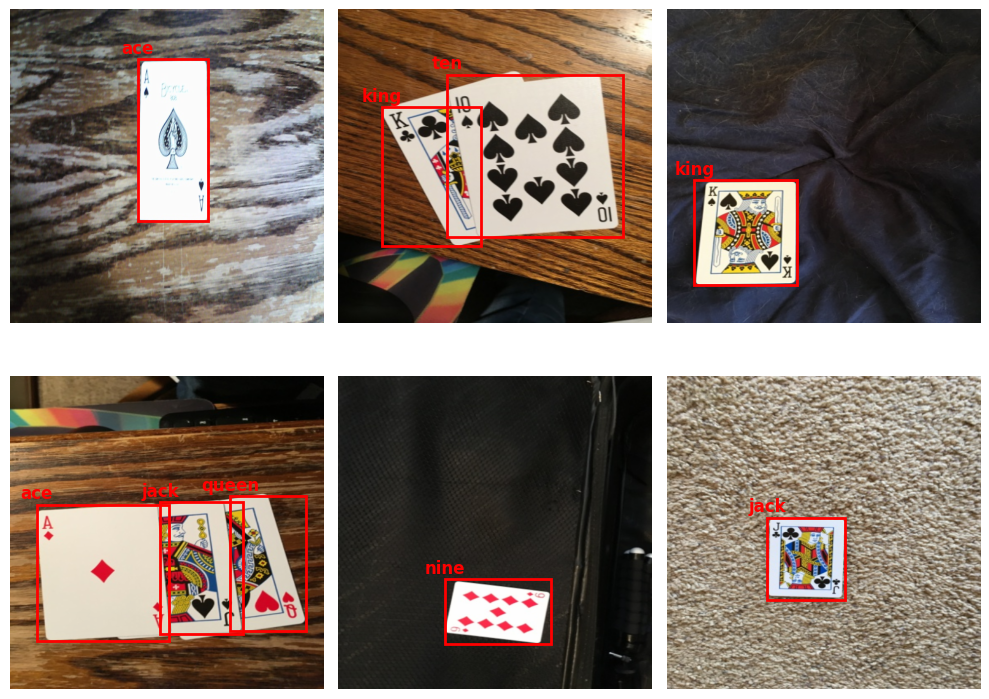

In [ ]:
out = [train_ds[i] for i in range(6)]
visualize([o["image"] for o in out], [o["bboxes"] for o in out])

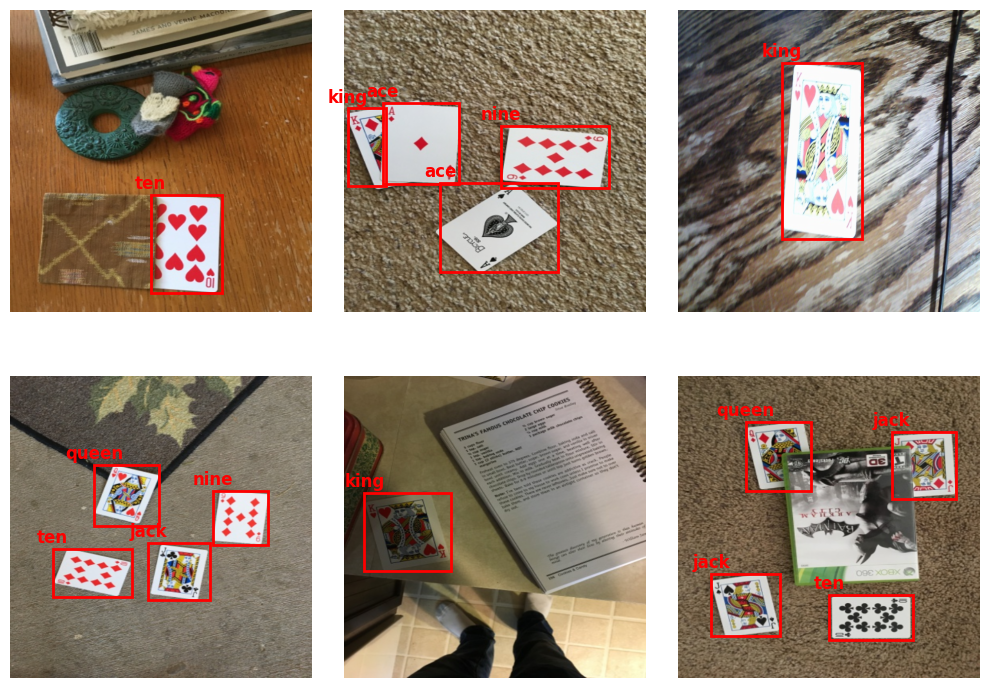

In [ ]:
out = [train_ds[i] for i in range(90, 96)]
visualize([o["image"] for o in out], [o["bboxes"] for o in out])

# Задача 3. 3 балла.
## YOLO-like детектор

Сейчас нам предстоить реализовать детектор, похожий на YOLO. Это один из самых простых детекторов с точки зрения реализации. YOLO описан в статье: [You Only Look Once: Unified, Real-Time Object Detection](https://arxiv.org/abs/1506.02640). Здесь мы его немного изменим и упростим. Будем использовать ResNet для извлечения признаков. На выходе мы будем получать карту признаков размера 16x16.

## Задача 3.1. 1 балл.

Первым делом нам нужно реализовать collate function. Это функция позволит нам кастомизировать, как именно батч конструируется из примеров (смотрите [pytorch docs](https://pytorch.org/docs/stable/data.html#dataloader-collate-fn) для деталей).

Это функция должна принять на вход лист прямоугольников и вернуть тензор размера Bx6x16x16. Первая размерность - это количество примеров в батче. Вторая -- "каналы", суть которых написана чуть ниже. Далее идут две пространственные размерности, это сетка 16 на 16. Зафиксируем порядок координат как (y, x) для этой сетки 16 на 16. Это значит, что в target идут ```cy_idx, cx_idx``` в таком порядке, см. код.

В шести "каналах" у нас будут записаны:
* Сдвиги центра bbox относительно начала клеточки (клеточка это "гиперпиксель" на изображении 16 на 16 на выходе сети). Записаны эти сдвиги будут в клеточку, к которой относятся. 2 канала (X, Y)
* Нормализованные ширина и высота bbox. 2 канала (W, H)
* Confidence сетки. Им мы будем пользоваться, чтобы фильтровать уверенность сетки в наличии bbox в данной клетке. Таргет содержит 1 там, где bbox есть, и 0 иначе. 1 канал
* Класс детекции (тот самый int, полученный из строки с названием)

### Пояснительная картинка.

Она обладает некоторым уровнем абстракции, чёрных например должно быть 512, а зелёная должна захватывать 32 маленькие черные. Но может будет понятнее :)

![image](https://i.imgur.com/13YVxAd.jpeg)

In [32]:
def collate_fn(batch, downsample=32):
    imgs, batch_boxes = map(list, (zip(*[(b["image"], b["bboxes"]) for b in batch])))

    imgs = torch.stack(imgs)
    b, _, h, w = imgs.shape

    target = imgs.new_zeros(b, 6, h // downsample, w // downsample)

    # Add sample index to targets
    for i, boxes in enumerate(batch_boxes):
        xmin, ymin, xmax, ymax, classes = map(
            torch.squeeze, torch.split(imgs.new_tensor(boxes), 1, dim=-1)
        )

        x_cell = downsample
        y_cell = downsample

        w_box =  (xmax - xmin) / w
        h_box =  (ymax - ymin) / h

        cx =  (xmin + xmax) / 2
        cy =  (ymin + ymax) / 2

        cx_idx = (cx / x_cell).long() # для получения целочисленного индекса
        cy_idx = (cy / y_cell).long()

        cx_box = (cx % x_cell) / x_cell
        cy_box = (cy % y_cell) / y_cell

        target[i, :, cy_idx, cx_idx] = torch.stack(
            [cx_box, cy_box, w_box, h_box, torch.ones_like(cx_box), classes]
        )

    return {"image": imgs, "target": target}

Следующей функцией Вы можете проверить свою реализацию. Проверка не является блокирующей.

In [33]:
def test_collate_fn() -> None:
    target1 = [100, 200, 200, 300, 2]  # xmin, ymin, xmax, ymax, class
    target2_1 = [0, 250, 200, 300, 0]  # xmin, ymin, xmax, ymax, class
    target2_2 = [0, 100, 100, 300, 1]  # xmin, ymin, xmax, ymax, class

    result = collate_fn(
        [
            {"image": torch.rand((3, 512, 512)), "bboxes": [target1]},
            {"image": torch.rand((3, 512, 512)), "bboxes": [target2_1, target2_2]},
        ]
    )

    # Проверяем размерности
    assert result["image"].shape == (2, 3, 512, 512)
    assert result["target"].shape == (2, 6, 16, 16)

    # Проверяем значения клеточек, в которые попали ббоксы
    assert np.allclose(
        result["target"][0, :, 7, 4],
        torch.tensor([22 / 32, 26 / 32, 100 / 512, 100 / 512, 1, 2]),
    )
    assert np.allclose(
        result["target"][1, :, 8, 3],
        torch.tensor([4 / 32, 19 / 32, 200 / 512, 50 / 512, 1, 0]),
    )
    assert np.allclose(
        result["target"][1, :, 6, 1],
        torch.tensor([18 / 32, 8 / 32, 100 / 512, 200 / 512, 1, 1]),
    )

    # Проверяем, что все остальные клеточки содержат нули
    result["target"][0, :, 7, 4] = result["target"][1, :, 8, 3] = result["target"][
        1, :, 6, 1
    ] = torch.zeros(6)
    assert np.allclose(result["target"], 0)


test_collate_fn()

Ниже вы можете увидеть пример, как выглядит решетка размера 16 на 16 на исходном изображении:

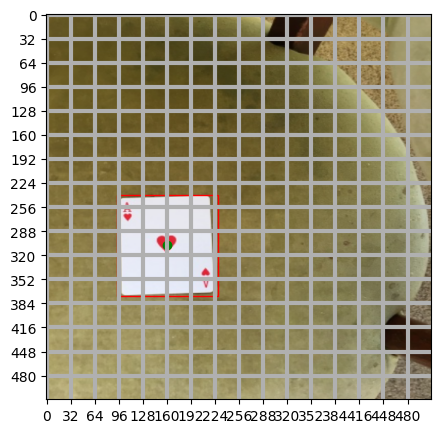

In [34]:
fig, ax = plt.subplots(figsize=(5, 5))
i = 20

img = train_ds[i]["image"].permute(1, 2, 0) * torch.tensor(std).view(
    1, 1, -1
) + torch.tensor(mean).view(1, 1, -1)
bboxes = torch.tensor(train_ds[i]["bboxes"])

ax.imshow(img)
loc = plt.matplotlib.ticker.MultipleLocator(base=32)
ax.xaxis.set_major_locator(loc)
ax.yaxis.set_major_locator(loc)
ax.grid(which="major", axis="both", linestyle="-", linewidth=3)

for bbox in bboxes:
    xmin, ymin, xmax, ymax = bbox[:-1]
    w = xmax - xmin
    h = ymax - ymin
    with_mask = bbox[-1]
    ax.add_patch(Rectangle((xmin, ymin), w, h, fill=False, color="red"))

cx = (bboxes[:, 0] + bboxes[:, 2]) / 2
cy = (bboxes[:, 1] + bboxes[:, 3]) / 2

ax.scatter(cx, cy, color="green", marker="o")

plt.show()

## Задача 3.2. 0.5 балла.

Выход нашей сетки будет несколько больше, чем Bx6x16x16. Почему?

Мы решаем задачу, где классов больше одного. Вспомним прошлое дз: target был одним числом, но выход сетки содержал длинный-длинный вектор, из которого мы получали вероятность принадлежности к тому или иному классу. Здесь то же самое, но как бы в двумерии: у каждой клеточки из этих 16*16 будет свой вектор длины C, который мы будем использовать для определения класса.

Реализуйте обратное относительно collate_fn преобразования, чтобы декодировать выход нейронной сети. Применив функцию decode_prediction к выходу collate function вы должны получить изначальный набор прямоугольников с корректными размерами и координатами, а также классами. Применив к выходу нейросети мы тоже должны получить набор прямоугольников и тоже с корректными классами.

То есть, нужно проделать операции из collate_fn в обратную сторону, но учесть, что у неройнки выход будет чуть длиннее, и там мы должны брать argmax для определения класса.

Hint: в target classes идут в конце. В нейронке они тоже будут в конце, но их будет больше 1. Можно проверять число каналов пришедшего объекта, если оно 6, то перед нами target и надо брать значение, которое записано в клеточке. Иначе (каналов больше 6) перед нами выход нейронки, и надо брать самый вероятный из них.

In [11]:
from typing import List

def decode_prediction(pred, upsample=32, threshold=0.7) -> List[List[List[float]]]:
    b, c, h, w = pred.shape
    img_w, img_h = w * upsample, h * upsample
    result = []

    cell_width = img_w / w
    cell_height = img_h / h

    for batch_idx in range(b):
        bboxes = []

        for i in range(h):
            for j in range(w):
                cx_box = pred[batch_idx, 0, i, j].item()
                cy_box = pred[batch_idx, 1, i, j].item()
                w_box = pred[batch_idx, 2, i, j].item()
                h_box = pred[batch_idx, 3, i, j].item()
                confidence = pred[batch_idx, 4, i, j].item()

                if confidence < threshold:
                    continue

                # абсолютные координаты центра
                cx_pixel = j * cell_width + cx_box * cell_width
                cy_pixel = i * cell_height + cy_box * cell_height
                w_pixel = w_box * img_w
                h_pixel = h_box * img_h

                xmin = max(0, cx_pixel - w_pixel / 2)
                ymin = max(0, cy_pixel - h_pixel / 2)
                xmax = min(img_w, cx_pixel + w_pixel / 2)
                ymax = min(img_h, cy_pixel + h_pixel / 2)

                if c == 6:
                    class_idx = int(pred[batch_idx, 5, i, j].item())
                else:
                    class_probs = pred[batch_idx, 5:, i, j].softmax(dim=0)
                    class_idx = torch.argmax(class_probs).item()

                bboxes.append([xmin, ymin, xmax, ymax, class_idx])

        result.append(bboxes)

    return result


Следующей функцией Вы можете проверить свою реализацию. Проверка не является блокирующей.

In [12]:
def test_decode_predictions() -> None:
    # Применяем collate_fn к некоторым данным
    target1 = [[100, 200, 200, 300, 2]]
    target2 = [[0, 250, 200, 300, 0], [0, 100, 100, 300, 1]]
    result = collate_fn(
        [
            {"image": torch.rand((3, 512, 512)), "bboxes": target1},
            {"image": torch.rand((3, 512, 512)), "bboxes": target2},
        ]
    )

    target = result["target"]
    assert target.shape == (2, 6, 16, 16)
    # В таком виде target соответствует поиску одного класса - 6-ой канал.
    # Добавим еще 2 канала, чтобы проверить работу функции для нескольких классов
    target = torch.cat(
        [target, torch.zeros(2, 2, 16, 16)], dim=1
    )  # Добавляем два канала
    assert target.shape == (2, 8, 16, 16)  # Теперь их стало 8

    target[0, 5:, 7, 4] = torch.tensor([0.5, 0.6, 0.9])  # Это должен быть класс 2
    target[1, 5:, 8, 3] = torch.tensor([0.9, 0.6, 0.5])  # Это должен быть класс 0
    target[1, 5:, 6, 1] = torch.tensor([0.6, 0.9, 0.5])  # Это должен быть класс 1

    # Считаем результат
    actual = decode_prediction(target)
    print("Actual:  ", actual)

    # Порядок ббоксов для target2 может меняться в зависимости от вашей реализации и это не ошибка.
    # Скорее всего, он будет такой. Но если ассерт не проходит, попробуйте поменять их местами.
    expected = [target1, [target2[1], target2[0]]]
    # expected = [ target1, [ target2[0], target2[1] ] ] # <-- такой ответ тоже правильный.
    print("Expected:", expected)

    # Сравниваем
    assert actual == expected


test_decode_predictions()

Actual:   [[[100.0, 200.0, 200.0, 300.0, 2]], [[0, 100.0, 100.0, 300.0, 1], [0, 250.0, 200.0, 300.0, 0]]]
Expected: [[[100, 200, 200, 300, 2]], [[0, 100, 100, 300, 1], [0, 250, 200, 300, 0]]]


## Задача 3.3. 1 балл.
Реализуйте модель. Первым делом примените первые 4 блока (до layer4 включительно, можно при помощи ```list(model.children())[:-2]```) ResNet50. Далее добавьте несколько блоков (Conv2D, BatchNorm2D, ReLU). Постепенно уменьшайте количество каналов до 5+C, а размер изображения до 16 на 16. Например, 2048 -> 512 -> 128 -> 32 -> 5+C, где С - количество классов в вашем датасете. Размер ядра при этом 3, паддинг 1. Но вариантов много, попробуйте разные! **Последним слоем обязательно должна быть свертка.** Так как все значения, которые мы предсказываем, находятся в отрезке от 0 до 1 (благодаря нормировке с клеточками), мы после финальной свертки еще применим сигмоиду. Для классов в такой постановке это не навредит.

Если будете фантазировать, то для получения правильного размера изображения после сети не стесняйтесь применять слои с фильтрами больше 3.

In [15]:
len(class_dict_test)

6

In [35]:
C =  len(class_dict_test)

class Detector(nn.Module):
    def __init__(self):
        super().__init__()
        model = torchvision.models.resnet50(weights=ResNet50_Weights.DEFAULT)

        self.backbone = nn.Sequential(*list(model.children())[:-2])

        self.head = nn.Sequential(
            nn.Conv2d(2048, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),

            nn.Conv2d(512, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),

            nn.Conv2d(128, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),

            nn.Conv2d(32, 5 + C, kernel_size=1, padding=0),
        )

        self.upsample = nn.Upsample(size=(16, 16), mode='bilinear', align_corners=False)

    def forward(self, img):
        x = self.backbone(img)
        x = self.head(x)
        x = torch.sigmoid(x)
        return x

## Задача 3.4. 0.5 балла.

Реализуйте функцию потерь.

Для этого:
* Сделайте маску, которая будет говорить о положении детектируемых объектов. Её нужно использовать с помощью masked_select (см. доки PyTorch)
* Лосс похож на оригинальный для Yolo V1 и состоит из 4 частей (reduction='sum' для всех)
    - localization loss - Мы берем MSE по координатам бокса там, где есть детектируемый объект
    - box_loss - MSE от корней ширины и высоты bbox там, где есть детектируемый объект
    - classification_loss - Если детектируемый объект есть, то его кросс-энтропия по его классу
    - confidence_loss - Бинарная кросс-энтропия факта наличия объекта ДЛЯ ВСЕХ пикселей. Делается отдельно для детектируемых объектов (вес 1) и для недетектируемых (вес 0.1 например, поскольку их гораздо больше, но можно экспериментировать)


* Если будете делать описанное выше, то учтите reduction. Бинарная кросс-энтропия вызывается через BCELoss. Параметр C используется для задачи числа классов. Подумайте как зависит индексация от параметра C и используйте его.

In [37]:
import torch.nn.functional as F
import torch.nn as nn

def special_loss(pred, target, C=C):
    obj_mask = target[:, 4] > 0  # [B, H, W]
    noobj_mask = ~obj_mask

    pred_cx = pred[:, 0][obj_mask]
    target_cx = target[:, 0][obj_mask]
    pred_cy = pred[:, 1][obj_mask]
    target_cy = target[:, 1][obj_mask]
    localization_loss = F.mse_loss(pred_cx, target_cx, reduction="sum") + \
                        F.mse_loss(pred_cy, target_cy, reduction="sum")

    pred_w = torch.sqrt(torch.clamp(pred[:, 2][obj_mask], min=1e-6))
    target_w = torch.sqrt(torch.clamp(target[:, 2][obj_mask], min=1e-6))
    pred_h = torch.sqrt(torch.clamp(pred[:, 3][obj_mask], min=1e-6))
    target_h = torch.sqrt(torch.clamp(target[:, 3][obj_mask], min=1e-6))
    box_loss = F.mse_loss(pred_w, target_w, reduction="sum") + \
               F.mse_loss(pred_h, target_h, reduction="sum")

    # Классификация
    class_logits = pred[:, 5:5+C].permute(0, 2, 3, 1)[obj_mask]
    class_target = target[:, 5][obj_mask].long()
    classification_loss = F.cross_entropy(class_logits, class_target, reduction="sum")

    # Уверенность
    conf_pred = pred[:, 4]
    conf_target = target[:, 4]

    conf_loss_obj = F.binary_cross_entropy(conf_pred[obj_mask], conf_target[obj_mask], reduction="sum")
    conf_loss_noobj = F.binary_cross_entropy(conf_pred[noobj_mask], conf_target[noobj_mask], reduction="sum")
    confidence_loss = conf_loss_obj + 0.1 * conf_loss_noobj

    return localization_loss + box_loss + classification_loss + confidence_loss


# Задача 4. 1 балла.

Обучите вашу модель (написав цикл обучения), и покажите что она работает (скорее всего, объекты найдутся на 1-2 картинках).

In [40]:
torch.cuda.empty_cache()
torch.cuda.ipc_collect()

In [38]:
loader = torch.utils.data.DataLoader(train_ds, 10, collate_fn=collate_fn)

In [41]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

torch.manual_seed(21)
EPOCHS =  15
model = Detector().to(device)
opt = torch.optim.AdamW(model.parameters(), lr=1e-3)

for e in tqdm(range(EPOCHS)):
    pbar = tqdm(loader, leave=False)
    epoch_losses = []
    for batch in pbar:
        preds = model(batch['image'].to(device))
        loss = special_loss(preds.to(device),
                            batch['target'].to(device),
                            C=len(class_dict_test))

        epoch_losses.append(loss.item())
        loss.backward()
        opt.step()
        opt.zero_grad()


    print(f"Epoch {e} done; Train loss {np.mean(epoch_losses):.3f};")

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 0 done; Train loss 157.836;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 1 done; Train loss 108.760;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 2 done; Train loss 86.471;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 3 done; Train loss 70.383;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 4 done; Train loss 58.086;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 5 done; Train loss 50.081;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 6 done; Train loss 44.144;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 7 done; Train loss 40.474;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 8 done; Train loss 37.614;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 9 done; Train loss 35.089;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 10 done; Train loss 33.541;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 11 done; Train loss 30.942;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 12 done; Train loss 29.530;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 13 done; Train loss 27.907;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 14 done; Train loss 27.152;


Запустим обученный детектор на тестовых изображениях:

In [42]:
test_loader = torch.utils.data.DataLoader(test_ds, 6, collate_fn=collate_fn)
i = iter(test_loader)
batch = next(i)

In [43]:
# Нужно сделать предсказание и переложить результат на cpu

model_cpu = model.eval()
pred_model = model(batch['image'].to(device)).cpu()
deс_pred = decode_prediction(pred_model)

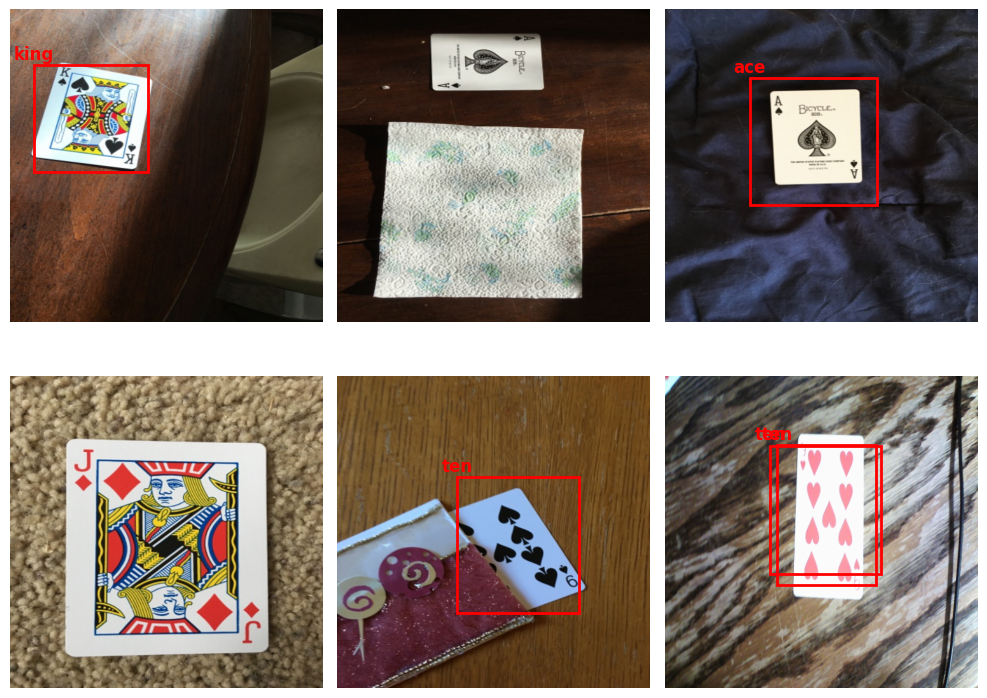

In [46]:
# Сделайте визуализацию. Поиграйтесь с threshold, скорее всего нужно понизить до ~0.1

visualize(batch['image'], decode_prediction(pred_model, threshold=0.3))

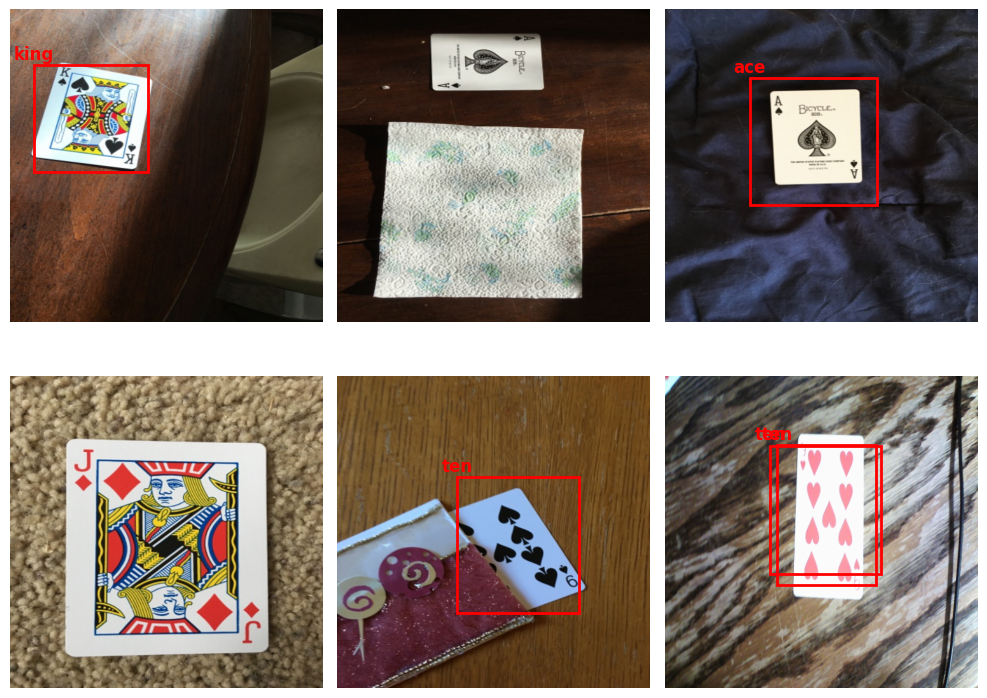

In [49]:
visualize(batch['image'], decode_prediction(pred_model, threshold=0.2))

Результат сильно так себе, да? Есть множество вариантов улучшений, самый простой из которых это приделать к выходу [NMS](https://paperswithcode.com/method/non-maximum-suppression#:~:text=Non%20Maximum%20Suppression%20is%20a,below%20a%20given%20probability%20bound.). Если хочется, можно почитать про YOLO v1 [тут](https://arxiv.org/abs/1506.02640).

# Задача 4 but better (1 балл)

## Прикручиваем NMS :^)

Напомним принцип работы алгоритма:
- Сортируем bbox в порядке убывания уверенности
- Считаем Intersection over Union (IoU) для всех bbox
- Выкидываем все, пересечение с которыми больше порога
- Идем дальше по списку, пока не дойдем до конца

In [56]:
def NMS(bboxes, threshold=0.5):
    bboxes = sorted(bboxes, key=lambda x: x[-1], reverse=True)
    res = []

    while bboxes:
        best = bboxes.pop(0)
        res.append(best)

        new_bboxes = []
        for box in bboxes:
            if best[4] != box[4]:
                new_bboxes.append(box)
                continue

            x1 = max(best[0], box[0])
            y1 = max(best[1], box[1])
            x2 = min(best[2], box[2])
            y2 = min(best[3], box[3])

            inter_area = max(0, x2 - x1) * max(0, y2 - y1)
            area_best = (best[2] - best[0]) * (best[3] - best[1])
            area_box = (box[2] - box[0]) * (box[3] - box[1])
            union_area = area_best + area_box - inter_area

            iou = inter_area / union_area if union_area > 0 else 0

            if iou < threshold:
                new_bboxes.append(box)

        bboxes = new_bboxes

    return res


In [60]:
def decode_prediction_nms(pred, upsample=32, threshold=0.7):
    b, c, h, w = pred.shape
    img_w, img_h = w * upsample, h * upsample

    cell_w = img_w / w
    cell_h = img_h / h
    res = []

    for batch_idx in range(b):
        bboxes = []
        for i in range(h):
            for j in range(w):
                data = pred[batch_idx, :, i, j]
                conf = data[4].item()
                if conf < threshold:
                    continue

                cx = j * cell_w + data[0].item() * cell_w
                cy = i * cell_h + data[1].item() * cell_h
                bw = data[2].item() * img_w
                bh = data[3].item() * img_h

                xmin = max(0, cx - bw / 2)
                ymin = max(0, cy - bh / 2)
                xmax = min(img_w, cx + bw / 2)
                ymax = min(img_h, cy + bh / 2)

                if c == 6:
                    cls = int(data[5].item())
                else:
                    cls = int(data[5:].softmax(dim=0).argmax().item())

                bboxes.append([xmin, ymin, xmax, ymax, cls])

        filtered = NMS(bboxes)
        res.append(filtered)

    return res

In [61]:
decode_prediction_nms = decode_prediction_nms(pred_model)

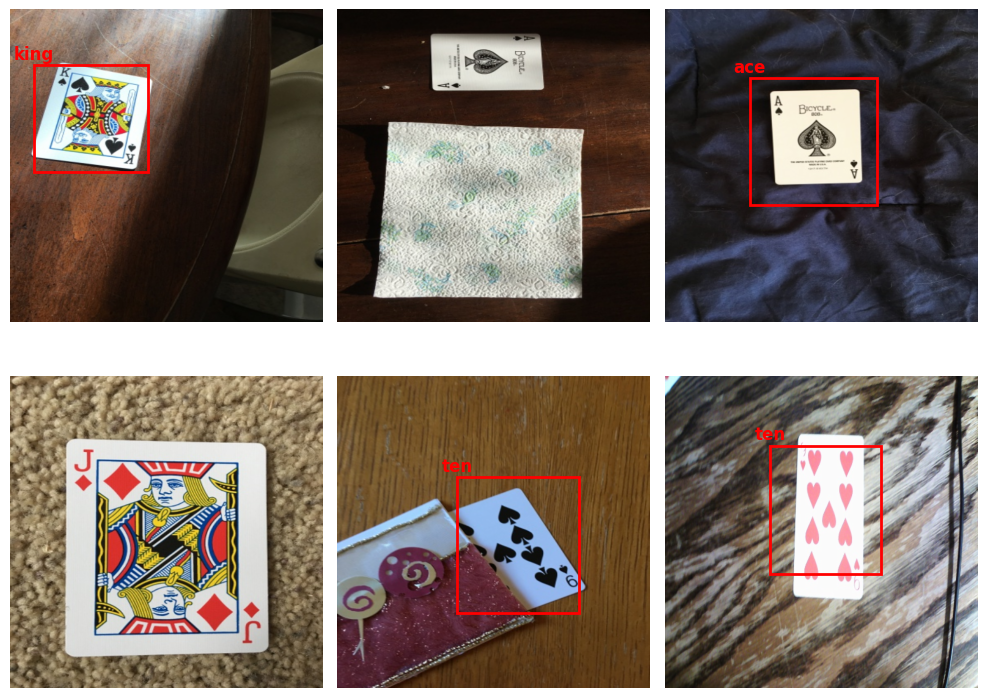

In [62]:
visualize(batch['image'], decode_prediction_nms) # выглядит презентабельнее

# Задача 5. 3.5 балла.

Займёмся более простыми вещами. Возьмем готовую архитектуру, обучим её на наших данных и посмотрим.

Для этого будем использовать YOLO 11 от ultralytics.

In [63]:
!pip install ultralytics

## Задача 5.1. 1.5 балла.

Чтобы дальше модель обучалась одной строкой, данные нужно переложить в правильный формат. Да-да, классика перекладывания JSON. Как правильно паковать можно посмотреть [тут](https://roboflow.com/formats/yolov8-pytorch-txt).

Если коротко:
* Есть .yaml, где живут пути к папкам с картинками, количество классов и их названия
* Есть папочки train valid (их поможем вам собрать), в них две подпапки:
    - Первая images, в ней лежат картинки
    - Вторая labels, в ней лежат файлы с названиями как у картинок, но вместо расширения картинок нужен .txt, внутри формат как описан на Roboflow


In [64]:
# Делаем папочки
!rm -rf train
!rm -rf valid
!mkdir -p train/images train/labels valid/images valid/labels

Реализуйте функцию, которая принимает аннотации в изначальном формате, а возвращает их в нужном для YOLO 11. Это должен быть массив готовых строк, которые можно сразу забрасывать в файлик, добавив \n.

Использовать сторонние инструменты нельзя, нужно переложить своими руками.

In [65]:
def annotation2txt(bboxes, w_im, h_im):

  lines = []
  for box in bboxes:
    xmin, ymin, xmax, ymax, class_id = box
    x_center = (xmin + xmax) / 2 / w_im
    y_center = (ymin + ymax) / 2 / h_im
    width = (xmax - xmin) / w_im
    height = (ymax - ymin) / h_im

    lines.append(f"{int(class_id)} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}")

    return lines

In [66]:
# Копируем картиночки по папочкам и создаем txt файлики


for i in range(len(train_ds)):
    result = train_ds.__get_raw_item__(i)

    shutil.copyfile(
        result[0],
        "./train/images/" + result[0].split("/")[-1],
    )

    h_im, w_im, ch = np.array(Image.open(result[0])).shape
    with open(
        "./train/labels/" + result[0].split("/")[-1].split(".")[0] + ".txt",
        "w",
        encoding="utf8",
    ) as f:
        f.write("\n".join(annotation2txt(result[1], w_im, h_im)))

for i in range(len(test_ds)):
    result = test_ds.__get_raw_item__(i)

    shutil.copyfile(
        result[0],
        "./valid/images/" + result[0].split("/")[-1],
    )
    h_im, w_im, ch = np.array(Image.open(result[0])).shape
    with open(
        "./valid/labels/" + result[0].split("/")[-1].split(".")[0] + ".txt",
        "w",
        encoding="utf8",
    ) as f:
        f.write("\n".join(annotation2txt(result[1], w_im, h_im)))

In [72]:
list(class_dict_test.keys())

['king', 'jack', 'ace', 'ten', 'nine', 'queen']

In [75]:
# Собираем YAML

nc =  len(class_dict_test)
names = list(class_dict_test.keys())

with open("data.yaml", "w") as f:
  f.write(f"""train: ../train/images
val: ../valid/images

nc: {nc}
names: {names}""")

## Задание 5.2. 1.5 балла.

Обучите модель YOLO 11 самого маленького размера. Библиотека максимально friendly, от вас требуется написать две строчки. Модель можно взять обученную.

Подсказка: подумайте зачем вам data.yaml и что такое yolo11n.yaml (не стесняйтесь гуглить)

Если у вас лосс NaN или Windows, то есть несколько полезных ссылок (покрывают не все существующие проблемы, но может поможет вам):

https://github.com/ultralytics/ultralytics/issues/1149

https://github.com/ultralytics/yolov5/issues/6907

https://stackoverflow.com/questions/75178762/i-got-nan-for-all-losses-while-training-yolov8-model

In [77]:
from ultralytics import YOLO

model = YOLO('yolo11n.yaml')
trai_model = model.train(data='data.yaml',
                            imgsz=512,
                            epochs=30,
                            batch=6,
                            name='yolo11n',
                            pretrained=False, device='0'
                            )

Ultralytics 8.3.134 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=6, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.yaml, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo11n, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=False, profile=Fal

100%|██████████| 755k/755k [00:00<00:00, 142MB/s]

Overriding model.yaml nc=80 with nc=6

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

YOLO11n summary: 181 layers, 2,591,010 parameters, 2,590,994 gradients, 6.4 GFLOPs

Freezing layer 'model.23.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


100%|██████████| 5.35M/5.35M [00:00<00:00, 352MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1742.5±677.4 MB/s, size: 89.3 KB)


train: Scanning /content/train/labels... 326 images, 0 backgrounds, 0 corrupt: 100%|██████████| 326/326 [00:00<00:00, 1879.47it/s]

train: New cache created: /content/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.1 ms, read: 1030.1±969.2 MB/s, size: 138.8 KB)


val: Scanning /content/valid/labels... 37 images, 0 backgrounds, 0 corrupt: 100%|██████████| 37/37 [00:00<00:00, 1123.44it/s]

val: New cache created: /content/valid/labels.cache


Plotting labels to runs/detect/yolo11n/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.000515625), 87 bias(decay=0.0)
Image sizes 512 train, 512 val
Using 2 dataloader workers
Logging results to runs/detect/yolo11n
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      11.3G      2.984       4.76      4.319          5        512: 100%|██████████| 55/55 [00:10<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.38it/s]

                   all         37         37   0.000775      0.229    0.00214   0.000614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      5.22G      3.045      4.546      4.002          7        512: 100%|██████████| 55/55 [00:08<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 10.75it/s]

                   all         37         37   0.000779      0.229    0.00134   0.000236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      5.24G      2.937      4.399      3.756          2        512: 100%|██████████| 55/55 [00:08<00:00,  6.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 10.19it/s]

                   all         37         37    0.00253      0.748     0.0636     0.0228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      5.25G      2.907      4.219       3.55          1        512: 100%|██████████| 55/55 [00:09<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.74it/s]

                   all         37         37    0.00331      0.667     0.0126    0.00473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      5.27G      2.768      4.118      3.364          3        512: 100%|██████████| 55/55 [00:07<00:00,  7.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.92it/s]

                   all         37         37    0.00293      0.794    0.00793    0.00297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      5.28G      2.802      3.929      3.286          6        512: 100%|██████████| 55/55 [00:08<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  9.53it/s]

                   all         37         37      0.173      0.075     0.0077    0.00277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      5.29G      2.665      3.823      3.175          2        512: 100%|██████████| 55/55 [00:08<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  9.76it/s]

                   all         37         37     0.0568       0.29     0.0285    0.00703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      5.31G      2.565      3.593      3.104          3        512: 100%|██████████| 55/55 [00:07<00:00,  7.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 10.48it/s]

                   all         37         37      0.162      0.262     0.0825     0.0455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      5.32G      2.414      3.463      2.999          5        512: 100%|██████████| 55/55 [00:08<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 10.16it/s]

                   all         37         37      0.332      0.418      0.249      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      5.34G      2.329      3.391      2.885          2        512: 100%|██████████| 55/55 [00:08<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 10.83it/s]

                   all         37         37      0.248      0.452      0.235       0.14



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      5.35G      2.249      3.313      2.807          4        512: 100%|██████████| 55/55 [00:07<00:00,  7.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.79it/s]


                   all         37         37      0.309      0.421      0.288      0.179

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      5.37G      2.177      3.182      2.761          3        512: 100%|██████████| 55/55 [00:07<00:00,  7.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 10.83it/s]

                   all         37         37      0.395      0.232      0.309      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      5.38G      2.079      3.222      2.705          2        512: 100%|██████████| 55/55 [00:08<00:00,  6.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 11.34it/s]

                   all         37         37      0.288      0.412       0.39      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30       5.4G       1.97      3.091      2.564          7        512: 100%|██████████| 55/55 [00:08<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 10.35it/s]

                   all         37         37      0.235      0.313      0.293      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      5.41G      1.859      2.911      2.467          4        512: 100%|██████████| 55/55 [00:07<00:00,  7.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 10.64it/s]

                   all         37         37      0.376       0.41      0.425      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      5.43G      1.818      2.919      2.432          5        512: 100%|██████████| 55/55 [00:08<00:00,  6.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 11.16it/s]

                   all         37         37      0.272       0.64      0.348      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      5.44G      1.779      2.804       2.39          5        512: 100%|██████████| 55/55 [00:08<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 10.98it/s]

                   all         37         37      0.414      0.364      0.383      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      5.46G      1.717      2.804      2.326          5        512: 100%|██████████| 55/55 [00:07<00:00,  7.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  9.73it/s]


                   all         37         37      0.341      0.451      0.377      0.269

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      5.47G       1.68      2.783      2.287          5        512: 100%|██████████| 55/55 [00:08<00:00,  6.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 11.02it/s]

                   all         37         37       0.39      0.553       0.46      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      5.49G      1.592      2.691      2.204          6        512: 100%|██████████| 55/55 [00:08<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 10.49it/s]

                   all         37         37      0.321      0.492      0.386      0.297


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30       5.5G      1.332      2.908      2.001          2        512: 100%|██████████| 55/55 [00:09<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 10.54it/s]

                   all         37         37      0.505      0.545      0.485      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      5.52G       1.27       2.81      1.929          2        512: 100%|██████████| 55/55 [00:07<00:00,  7.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 10.87it/s]

                   all         37         37       0.37      0.538      0.487      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      5.53G      1.245      2.697      1.879          2        512: 100%|██████████| 55/55 [00:08<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 10.46it/s]

                   all         37         37      0.415      0.481      0.505      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      5.55G       1.21      2.638      1.843          2        512: 100%|██████████| 55/55 [00:08<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 10.43it/s]

                   all         37         37      0.437      0.608      0.494      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      5.56G      1.171       2.57      1.804          2        512: 100%|██████████| 55/55 [00:07<00:00,  7.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 10.81it/s]

                   all         37         37      0.482      0.639       0.58      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      5.58G      1.169      2.572      1.818          2        512: 100%|██████████| 55/55 [00:08<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 11.05it/s]

                   all         37         37      0.547      0.603      0.605      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      5.59G      1.179      2.513      1.836          2        512: 100%|██████████| 55/55 [00:08<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 10.83it/s]

                   all         37         37      0.494      0.645      0.577      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      5.61G       1.16      2.463      1.813          2        512: 100%|██████████| 55/55 [00:07<00:00,  7.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.68it/s]

                   all         37         37      0.479      0.633      0.581      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      5.62G      1.148       2.54      1.811          2        512: 100%|██████████| 55/55 [00:08<00:00,  6.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 11.16it/s]

                   all         37         37      0.519      0.643      0.558      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      5.63G      1.125      2.427      1.775          2        512: 100%|██████████| 55/55 [00:08<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 10.55it/s]

                   all         37         37      0.504      0.659      0.589      0.483



30 epochs completed in 0.077 hours.
Optimizer stripped from runs/detect/yolo11n/weights/last.pt, 5.4MB
Optimizer stripped from runs/detect/yolo11n/weights/best.pt, 5.4MB

Validating runs/detect/yolo11n/weights/best.pt...
Ultralytics 8.3.134 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,583,322 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.36it/s]


                   all         37         37      0.548      0.602      0.605      0.487
                  king          6          6      0.393      0.667      0.648      0.491
                  jack          5          5      0.355        0.8      0.586      0.478
                   ace         12         12      0.867      0.544       0.71      0.536
                   ten          3          3      0.971      0.667      0.913      0.747
                  nine          7          7      0.433      0.438      0.452      0.381
                 queen          4          4      0.269        0.5      0.323      0.291
Speed: 0.4ms preprocess, 7.9ms inference, 0.0ms loss, 3.5ms postprocess per image
Results saved to runs/detect/yolo11n


## Задание 5.3. 0.5 балла.

Как-нибудь отрисуйте предсказания на валидационной выборке (хотя бы части из 5-10 картинок).

Здесь можно использовать костыли с параметром save=True у predict, потом прочитать их чем-нибудь, отрисовать матплотлибом. Есть варианты и получше. Дефолтный show будет пытаться показывать через opencv imshow, он в коллабе работать не будет.

In [83]:
pics = glob.glob('valid/images/*')[10:16]

res = model.predict(pics,
                    save=True,
                    project='pred_results',
                    name='predictions',
                    exist_ok=True)


0: 512x384 1 ace, 2.9ms
1: 512x384 (no detections), 2.9ms
2: 512x384 1 ten, 2.9ms
3: 512x384 1 king, 1 jack, 2.9ms
4: 512x384 1 ten, 1 nine, 2.9ms
5: 512x384 (no detections), 2.9ms
Speed: 2.2ms preprocess, 2.9ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 384)
Results saved to pred_results/predictions



image 1/1 /content/valid/images/IMG_2420.JPG: 512x384 1 ace, 13.5ms
Speed: 2.9ms preprocess, 13.5ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 384)

image 1/1 /content/valid/images/IMG_2551.JPG: 512x384 (no detections), 11.3ms
Speed: 1.8ms preprocess, 11.3ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 384)

image 1/1 /content/valid/images/IMG_2406.JPG: 512x384 1 ten, 10.0ms
Speed: 1.6ms preprocess, 10.0ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 384)

image 1/1 /content/valid/images/IMG_2683.JPG: 512x384 1 king, 1 jack, 10.9ms
Speed: 1.8ms preprocess, 10.9ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 384)

image 1/1 /content/valid/images/IMG_2596.JPG: 512x384 1 ten, 1 nine, 12.5ms
Speed: 2.6ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 384)

image 1/1 /content/valid/images/IMG_2519.JPG: 512x384 (no detections), 11.0ms
Speed: 1.9ms preprocess, 11.0ms inference, 0.8ms postprocess per

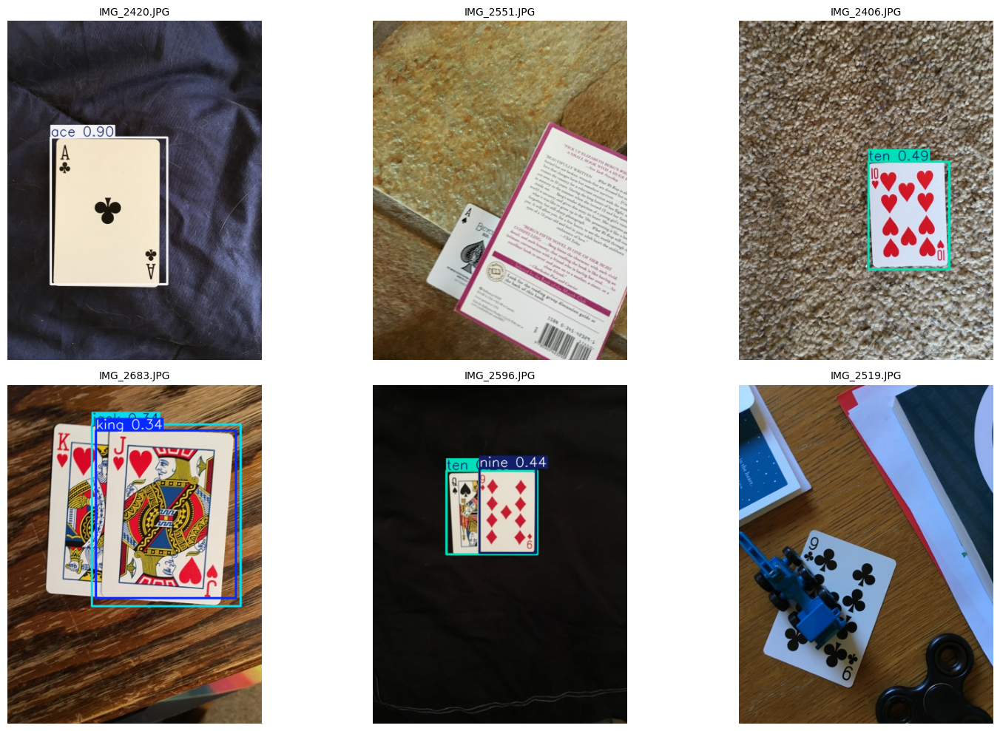

In [84]:
import cv2

plt.figure(figsize=(16, 10))

for i, pic_path in enumerate(pics):
    result = model(pic_path)[0]
    pic_bgr = result.plot()
    pic_rgb = cv2.cvtColor(pic_bgr, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 3, i + 1)
    plt.imshow(pic_rgb)
    plt.title(f"{pic_path.split('/')[-1]}", fontsize=10)
    plt.axis('off')

plt.tight_layout()
plt.show()

## Бонус (1 балл)

Реализуйте подсчет mAP для самописной модели. Если найдете готовый код на гитхабах -- используйте с указанием ссылок :)

Сравните свою модель с YOLO11. Что получается?

**Справка:**
Средняя точность (mAP): mAP расширяет концепцию AP, вычисляя средние значения AP для нескольких классов объектов. Это полезно в сценариях обнаружения многоклассовых объектов для всесторонней оценки эффективности модели.
Источник: https://docs.ultralytics.com/ru/guides/yolo-performance-metrics/

In [86]:
!pip install torchmetrics -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 961.5/961.5 kB 46.1 MB/s eta 0:00:00
